In [1]:
import pickle
import numpy as np
import pandas as pd
import math
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import sys
import os

In [2]:
sys.path.append(os.path.abspath(os.path.join('../scripts')))


In [3]:
from outlier import Outlier 
from Visualizer import *
from selector import *

In [6]:
user_engagement = pd.read_csv("../data/user_engagement_data.csv")
user_engagement.head(10)

,Unnamed: 0,cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session
0,0,2,3.360300e+10,7.613873e+07,4.095721e+11,805,805
1,1,1,3.360301e+10,1.203250e+05,6.424631e+08,2,2
2,2,1,3.360301e+10,1.357180e+05,8.640132e+08,1,1
3,3,1,3.360301e+10,1.099060e+05,1.223044e+08,1,1
4,4,1,3.360301e+10,1.359680e+05,4.467712e+08,1,1
5,5,1,3.360301e+10,3.178510e+05,7.844932e+08,2,2
6,6,1,3.360302e+10,2.333000e+04,4.269253e+08,1,1
7,7,1,3.360302e+10,2.040000e+04,4.062485e+08,1,1
8,8,1,3.360302e+10,1.276990e+05,6.763139e+08,1,1
9,9,1,3.360302e+10,4.991300e+04,6.977717e+08,1,1


In [8]:
user_experience = pd.read_csv("../data/user_experience_data.csv")
user_experience.head(10)

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
0,3.360300e+10,2,239.0,61157.0,1.134638e+07
1,3.360301e+10,0,81.0,8871.0,7.872054e+06
2,3.360301e+10,1,30.0,15.0,2.060300e+04
3,3.360301e+10,1,22.0,115.0,2.680560e+06
4,3.360301e+10,1,27.0,67.0,3.848730e+05
5,3.360301e+10,0,94.0,126.0,3.011466e+06
6,3.360302e+10,1,124.0,1375.0,1.033680e+05
7,3.360302e+10,1,127.0,489.0,4.087000e+03
8,3.360302e+10,1,28.0,113.0,7.190180e+05
9,3.360302e+10,1,68.5,13514.0,3.841900e+04


### Engagement

In [11]:
eng = user_engagement.set_index('MSISDN/Number')[
    ['no.xdr_session', 'Dur. (ms)', 'Total Data Volume (Bytes)']]

In [13]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(eng)
scaled_data

array([[ 1.03402261e+01,  9.61907022e+00,  1.06449071e+01],
       [ 4.43336225e-03, -5.74903850e-03, -4.70442415e-03],
       [-8.43811066e-03, -3.80010460e-03,  1.06532902e-03],
       ...,
       [-8.43811066e-03, -1.26215216e-02, -8.90762190e-03],
       [-8.43811066e-03,  6.13777439e-03, -1.11554396e-02],
       [ 2.99304793e+02,  2.99303952e+02,  2.99285868e+02]])

In [14]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.58468756,  0.54390984,  0.60191573],
       [ 0.5124752 , -0.664561  , -0.54380864],
       [-0.90581982, -0.40793611,  0.11436164],
       ...,
       [-0.47936828, -0.71702747, -0.50604117],
       [-0.55242238,  0.40182501, -0.73031923],
       [ 0.57736298,  0.57736136,  0.57732647]])

In [15]:
with open("../models/user_engagement.pkl", "rb") as f:
    kmeans1 = pickle.load(f)

In [16]:
less_engaged_cluster = 5

In [17]:
distance = kmeans1.fit_transform(normalized_data)
distance_from_less_engaged_cluster = list(
    map(lambda x: x[less_engaged_cluster], distance))
user_engagement['engagement_score'] = distance_from_less_engaged_cluster
user_engagement.head()

,Unnamed: 0,cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score
0,0,2,3.360300e+10,7.613873e+07,4.095721e+11,805,805,1.315048
1,1,1,3.360301e+10,1.203250e+05,6.424631e+08,2,2,0.908184
2,2,1,3.360301e+10,1.357180e+05,8.640132e+08,1,1,1.321734
3,3,1,3.360301e+10,1.099060e+05,1.223044e+08,1,1,1.473757
4,4,1,3.360301e+10,1.359680e+05,4.467712e+08,1,1,1.523620


### Experience

In [18]:
exp = user_experience.set_index('MSISDN/Number')[
    ['Total Avg RTT (ms)', 'Total Avg Bearer TP (kbps)', 'Total TCP Retrans. Vol (Bytes)']]

In [20]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(exp)
scaled_data

array([[ 2.80375867,  2.35232429,  2.60093555],
       [-0.03259825, -0.24010315,  1.56907483],
       [-0.94813118, -0.67919847, -0.76277599],
       ...,
       [-0.9660828 , -0.27376911, -0.76324643],
       [-1.10969581, -0.67919847, -0.75374404],
       [ 2.80375867,  2.35232429,  2.60093555]])

In [21]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.62445663,  0.5239126 ,  0.57928361],
       [-0.02053208, -0.15122953,  0.98828542],
       [-0.68035205, -0.48737356, -0.54734642],
       ...,
       [-0.76595827, -0.21705771, -0.60513955],
       [-0.73801738, -0.45170962, -0.50128711],
       [ 0.62445663,  0.5239126 ,  0.57928361]])

In [22]:
with open("../models/user_experience.pkl", "rb") as f:
    kmeans2 = pickle.load(f)

In [23]:
worst_experience_cluster = 1

In [25]:
distance = kmeans2.fit_transform(normalized_data)
distance_from_worst_experience_cluster = list(
    map(lambda x: x[worst_experience_cluster], distance))
user_experience['experience_score'] = distance_from_worst_experience_cluster
user_experience.head(10)

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,3.360300e+10,2,239.0,61157.0,1.134638e+07,1.819357
1,3.360301e+10,0,81.0,8871.0,7.872054e+06,1.616661
2,3.360301e+10,1,30.0,15.0,2.060300e+04,0.320122
3,3.360301e+10,1,22.0,115.0,2.680560e+06,0.754229
4,3.360301e+10,1,27.0,67.0,3.848730e+05,0.375978
5,3.360301e+10,0,94.0,126.0,3.011466e+06,1.064616
6,3.360302e+10,1,124.0,1375.0,1.033680e+05,0.973152
7,3.360302e+10,1,127.0,489.0,4.087000e+03,0.979657
8,3.360302e+10,1,28.0,113.0,7.190180e+05,0.408330
9,3.360302e+10,1,68.5,13514.0,3.841900e+04,0.633034


### Satisfaction

In [27]:
user_engagement.rename(columns={'cluster': 'engagement_cluster'}, inplace=True)
user_engagement.head(10)

,Unnamed: 0,engagement_cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score
0,0,2,3.360300e+10,7.613873e+07,4.095721e+11,805,805,1.315048
1,1,1,3.360301e+10,1.203250e+05,6.424631e+08,2,2,0.908184
2,2,1,3.360301e+10,1.357180e+05,8.640132e+08,1,1,1.321734
3,3,1,3.360301e+10,1.099060e+05,1.223044e+08,1,1,1.473757
4,4,1,3.360301e+10,1.359680e+05,4.467712e+08,1,1,1.523620
5,5,1,3.360301e+10,3.178510e+05,7.844932e+08,2,2,1.750507
6,6,1,3.360302e+10,2.333000e+04,4.269253e+08,1,1,1.093527
7,7,1,3.360302e+10,2.040000e+04,4.062485e+08,1,1,1.096602
8,8,1,3.360302e+10,1.276990e+05,6.763139e+08,1,1,1.391121
9,9,1,3.360302e+10,4.991300e+04,6.977717e+08,1,1,1.009718


In [28]:
user_experience.rename(columns={'cluster': 'experience_cluster'}, inplace=True)
user_experience.head(10)

,MSISDN/Number,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,3.360300e+10,2,239.0,61157.0,1.134638e+07,1.819357
1,3.360301e+10,0,81.0,8871.0,7.872054e+06,1.616661
2,3.360301e+10,1,30.0,15.0,2.060300e+04,0.320122
3,3.360301e+10,1,22.0,115.0,2.680560e+06,0.754229
4,3.360301e+10,1,27.0,67.0,3.848730e+05,0.375978
5,3.360301e+10,0,94.0,126.0,3.011466e+06,1.064616
6,3.360302e+10,1,124.0,1375.0,1.033680e+05,0.973152
7,3.360302e+10,1,127.0,489.0,4.087000e+03,0.979657
8,3.360302e+10,1,28.0,113.0,7.190180e+05,0.408330
9,3.360302e+10,1,68.5,13514.0,3.841900e+04,0.633034


In [29]:
user_satisfaction = pd.merge(user_engagement, user_experience, on='MSISDN/Number')
user_satisfaction['satisfaction_score'] = (
    user_satisfaction['engagement_score'] + user_satisfaction['experience_score'])/2
user_satisfaction.head(10)

,Unnamed: 0,engagement_cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score,satisfaction_score
0,0,2,3.360300e+10,7.613873e+07,4.095721e+11,805,805,1.315048,2,239.0,61157.0,1.134638e+07,1.819357,1.567202
1,1,1,3.360301e+10,1.203250e+05,6.424631e+08,2,2,0.908184,0,81.0,8871.0,7.872054e+06,1.616661,1.262422
2,2,1,3.360301e+10,1.357180e+05,8.640132e+08,1,1,1.321734,1,30.0,15.0,2.060300e+04,0.320122,0.820928
3,3,1,3.360301e+10,1.099060e+05,1.223044e+08,1,1,1.473757,1,22.0,115.0,2.680560e+06,0.754229,1.113993
4,4,1,3.360301e+10,1.359680e+05,4.467712e+08,1,1,1.523620,1,27.0,67.0,3.848730e+05,0.375978,0.949799
5,5,1,3.360301e+10,3.178510e+05,7.844932e+08,2,2,1.750507,0,94.0,126.0,3.011466e+06,1.064616,1.407561
6,6,1,3.360302e+10,2.333000e+04,4.269253e+08,1,1,1.093527,1,124.0,1375.0,1.033680e+05,0.973152,1.033339
7,7,1,3.360302e+10,2.040000e+04,4.062485e+08,1,1,1.096602,1,127.0,489.0,4.087000e+03,0.979657,1.038129
8,8,1,3.360302e+10,1.276990e+05,6.763139e+08,1,1,1.391121,1,28.0,113.0,7.190180e+05,0.408330,0.899726
9,9,1,3.360302e+10,4.991300e+04,6.977717e+08,1,1,1.009718,1,68.5,13514.0,3.841900e+04,0.633034,0.821376


In [30]:
user_satisfaction = user_satisfaction[['MSISDN/Number', 'engagement_score',
                        'experience_score', 'satisfaction_score']]
user_satisfaction.set_index('MSISDN/Number', inplace=True)
user_satisfaction.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.360300e+10,1.315048,1.819357,1.567202
3.360301e+10,0.908184,1.616661,1.262422
3.360301e+10,1.321734,0.320122,0.820928
3.360301e+10,1.473757,0.754229,1.113993
3.360301e+10,1.523620,0.375978,0.949799


In [32]:
top10_satisfied = user_satisfaction.sort_values('satisfaction_score', ascending=False).head(10)
top10_satisfied

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.366447e+10,1.868031,1.829424,1.848728
3.362158e+10,1.864320,1.807050,1.835685
3.365980e+10,1.868088,1.779634,1.823861
3.368871e+10,1.860929,1.783859,1.822394
3.369890e+10,1.810957,1.822252,1.816604
3.366244e+10,1.805943,1.806270,1.806107
3.369819e+10,1.780430,1.830853,1.805642
3.364161e+10,1.782755,1.825630,1.804192
3.366111e+10,1.779318,1.827507,1.803412


### Linear Regression for satisfaction score prediction

In [33]:
# splitting training and testing data
X = user_satisfaction[['engagement_score', 'experience_score']]
y = user_satisfaction[['satisfaction_score']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [34]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [35]:
y_pred = model.predict(X_test)

In [36]:
print(f'Intercept: {model.intercept_}')
print(f'Coefficients: { model.coef_}')
print(f"Mean squared error: {np.mean((y_pred - y_test.values) ** 2)}")

Intercept: [-8.8817842e-16]
Coefficients: [[0.5 0.5]]
Mean squared error: 1.4701794109825447e-31


### Outliers

In [37]:
db = user_satisfaction.copy(deep=True)
db.head(10)

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.360300e+10,1.315048,1.819357,1.567202
3.360301e+10,0.908184,1.616661,1.262422
3.360301e+10,1.321734,0.320122,0.820928
3.360301e+10,1.473757,0.754229,1.113993
3.360301e+10,1.523620,0.375978,0.949799
3.360301e+10,1.750507,1.064616,1.407561
3.360302e+10,1.093527,0.973152,1.033339
3.360302e+10,1.096602,0.979657,1.038129
3.360302e+10,1.391121,0.408330,0.899726


In [38]:
db = db[['engagement_score', 'experience_score']]
db.head(10)

,engagement_score,experience_score
MSISDN/Number,,
3.360300e+10,1.315048,1.819357
3.360301e+10,0.908184,1.616661
3.360301e+10,1.321734,0.320122
3.360301e+10,1.473757,0.754229
3.360301e+10,1.523620,0.375978
3.360301e+10,1.750507,1.064616
3.360302e+10,1.093527,0.973152
3.360302e+10,1.096602,0.979657
3.360302e+10,1.391121,0.408330


In [39]:
outlier = Outlier(db)

In [40]:
outlier.getOverview(['engagement_score', 'experience_score'])

Name of columns,engagement_score,experience_score
Min,0.12111,0.169137
Q1,1.08496,0.357826
Median,1.28582,1.05118
Q3,1.51584,1.51454
Max,1.87555,1.83086
IQR,0.430885,1.15671
Lower fence,0.438628,-1.37724
Upper fence,2.16217,3.2496
Skew,-0.77251,-0.038667
Number_of_outliers,3123,0


<AxesSubplot:>

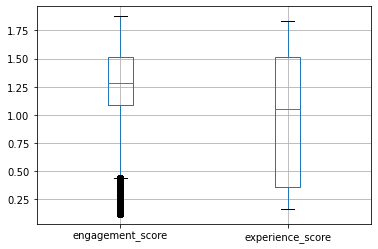

In [41]:
db.boxplot()

### K-means Clusturing

In [42]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(db)
scaled_data

array([[ 0.12462258,  1.44002286],
       [-1.07057919,  1.09005007],
       [ 0.1442635 , -1.14854994],
       ...,
       [-0.22866642, -0.83762921],
       [ 1.56581481, -1.03755214],
       [ 0.20304112,  1.44002286]])

In [43]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.08621981,  0.99627614],
       [-0.70070611,  0.71345003],
       [ 0.12462566, -0.99220383],
       ...,
       [-0.26335547, -0.96469886],
       [ 0.83360101, -0.55236705],
       [ 0.13961753,  0.99020551]])

In [44]:
kmeans = KMeans(n_clusters=2, random_state=1).fit(normalized_data)
kmeans.labels_

array([1, 1, 0, ..., 0, 0, 1])

In [45]:
user_satisfaction.insert(0, 'satisfaction_cluster', kmeans.labels_)
user_satisfaction

,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,,
3.360300e+10,1,1.315048,1.819357,1.567202
3.360301e+10,1,0.908184,1.616661,1.262422
3.360301e+10,0,1.321734,0.320122,0.820928
3.360301e+10,0,1.473757,0.754229,1.113993
3.360301e+10,0,1.523620,0.375978,0.949799
...,...,...,...,...
3.370000e+10,0,1.613317,0.315899,0.964608
3.370000e+10,1,0.976508,1.161176,1.068842
3.370000e+10,0,1.194783,0.500199,0.847491


In [46]:
user_satisfaction['satisfaction_cluster'].value_counts()

1    48248
0    41453
Name: satisfaction_cluster, dtype: int64

In [47]:
fig = px.scatter(user_satisfaction, x='engagement_score', y='experience_score',
                 color='satisfaction_cluster', size='satisfaction_score')
fig.show()

In [48]:
# average satisfaction & experience score per cluster
user_satisfaction.groupby('satisfaction_cluster').agg(
    {'satisfaction_score': 'mean', 'experience_score': 'mean'})

,satisfaction_score,experience_score
satisfaction_cluster,,
0,0.909974,0.421536
1,1.317140,1.469726


### Export dataframe to mysql

In [ ]:
engine = create_engine('mysql+pymysql://root:@localhost/tellco')

In [ ]:
# writing to database
try:
    print('writing to the database')
    frame = user_satisfaction_df.to_sql(
        "telco_analysis_score", con=engine, if_exists='replace')
except Exception as e:
  print("Error writing to database: ", e)

In [ ]:
# reading from database
pd.read_sql("select * from tellco.telco_analysis_score", engine)

In [ ]:
# save the dataframe
user_satisfaction_df.to_csv('../data/user_satisfaction_data.csv')